# Neural Style Transfer
---------------------------------------


In [2]:
from PIL import Image

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

import matplotlib.pyplot as plt


import torchvision.transforms as transforms
import torchvision.models as models

import copy

import warnings
warnings.filterwarnings("ignore", category=UserWarning) 

In [29]:
imsize = 256  

loader = transforms.Compose([
    transforms.Resize(imsize),
    transforms.CenterCrop(imsize),
    transforms.ToTensor(),
    ]) 

In [159]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# load images
def image_loader(image_name):
    image = Image.open(image_name)
    image = loader(image)
    image = image.unsqueeze(0)
    return image.to(device, torch.float)

style_img_1 = image_loader("style_1.jpg")
style_img_2 = image_loader("style_2.jpg")
style_img_3 = image_loader("style_3.jpg")
style_img_4 = image_loader("style_4.jpg")

style_img = torch.cat((style_img_1, style_img_2, style_img_3, style_img_4), 0)
content_img_1 = image_loader("content_1.jpg")
content_img_2 = image_loader("content_2.jpg")

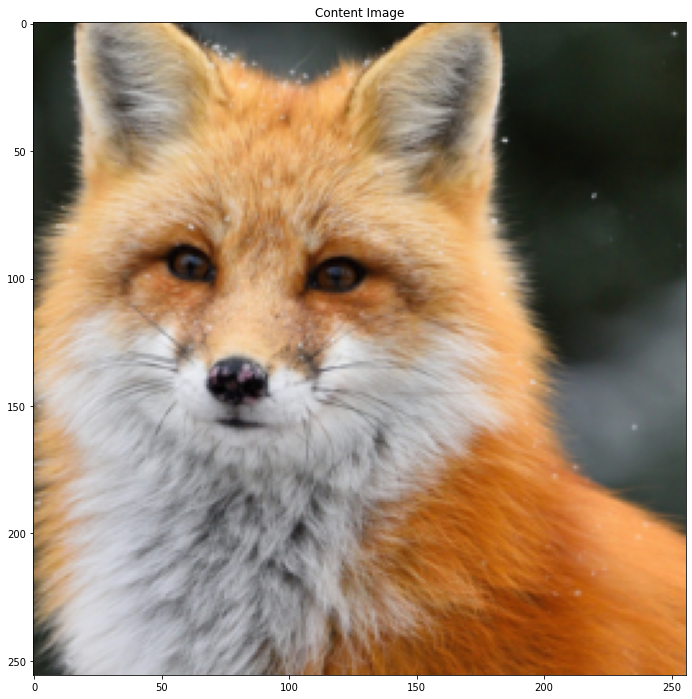

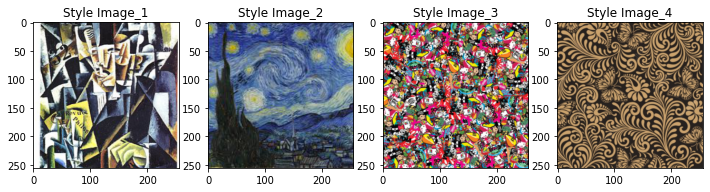

In [37]:
unloader = transforms.ToPILImage() # tensor to picture  

def imshow(tensor, title=None): # show image

    tensor = tensor.cpu().clone()  

    fig, ax = plt.subplots(1, tensor.shape[0], figsize=(12,12*tensor.shape[0]))

    if (tensor.shape[0] == 1):
        img = unloader(tensor[0])
        ax.imshow(img)
        if title is not None:
            ax.set_title(title[0])
    else:
        for index, img in enumerate(tensor):
            img = unloader(img)
            ax[index].imshow(img)
            if title is not None:
                ax[index].set_title(title[index])
    plt.pause(0.001) 

imshow(content_img_1, title=['Content Image'])
imshow(style_img, title=['Style Image_1', 'Style Image_2', "Style Image_3", "Style Image_4"])

##Define supporting functions

In [6]:
cnn_normalization_mean = torch.tensor([0.485, 0.456, 0.406]).to(device)
cnn_normalization_std = torch.tensor([0.229, 0.224, 0.225]).to(device)

class Normalization(nn.Module):
        def __init__(self, mean, std):
            super(Normalization, self).__init__()
            # .view the mean and std to make them [C x 1 x 1] so that they can
            # directly work with image Tensor of shape [B x C x H x W].
            # B is batch size. C is number of channels. H is height and W is width.
            self.mean = mean.clone().detach().view(-1, 1, 1)
            self.std = std.clone().detach().view(-1, 1, 1)

        def forward(self, img):
            # normalize img
            return (img - self.mean) / self.std

In [7]:
content_layers_default = ['conv_4']
style_layers_default = ['conv_1', 'conv_2', 'conv_3', 'conv_4', 'conv_5']

In [8]:
cnn = models.vgg19(pretrained=True).features.to(device).eval()

def get_input_optimizer(input_img):
        # this line to show that input is a parameter that requires a gradient
        #добоваляет содержимое тензора катринки в список изменяемых оптимизатором параметров
        optimizer = optim.LBFGS([input_img.requires_grad_()], lr = 0.1) 
        return optimizer

Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth



###General model

In [9]:
def get_style_model_and_losses(cnn, normalization_mean, normalization_std,
                                   style_img, content_img, params = None, mode = "mix",
                                   mask = None, content_layers=content_layers_default,
                                   style_layers=style_layers_default):
        cnn = copy.deepcopy(cnn)

        # normalization module
        normalization = Normalization(normalization_mean, normalization_std).to(device)

        # just in order to have an iterable access to or list of content/syle
        # losses
        content_losses = []
        style_losses = []

        # assuming that cnn is a nn.Sequential, so we make a new nn.Sequential
        # to put in modules that are supposed to be activated sequentially
        model = nn.Sequential(normalization)

        

  
        i = 0  # increment every time we see a conv
        for layer in cnn.children():
            
            if isinstance(layer, nn.Conv2d):
                i += 1
                name = 'conv_{}'.format(i)
            elif isinstance(layer, nn.ReLU):
                name = 'relu_{}'.format(i)
                # The in-place version doesn't play very nicely with the ContentLoss
                # and StyleLoss we insert below. So we replace with out-of-place
                # ones here.
                #Переопределим relu уровень
                layer = nn.ReLU(inplace=False)
            elif isinstance(layer, nn.MaxPool2d):
                name = 'pool_{}'.format(i)
            elif isinstance(layer, nn.BatchNorm2d):
                name = 'bn_{}'.format(i)
            else:
                raise RuntimeError('Unrecognized layer: {}'.format(layer.__class__.__name__))

            model.add_module(name, layer)
            
            
            if name in content_layers:
                # add content loss:  
                target = model(content_img).detach()
                content_loss = ContentLoss(target)
                model.add_module("content_loss_{}".format(i), content_loss)
                content_losses.append(content_loss)


            if name in style_layers:
                # add style loss:
                target_feature = model(style_img).detach()

                #select mode loss
                if mode == "mix":
                    StyleLoss = StyleLoss_mix_styles
                    style_loss = StyleLoss(target_feature, params)
                if mode == "sep":
                    StyleLoss = StyleLoss_sep_styles
                    style_loss = StyleLoss(target_feature, params, mask)

                model.add_module("style_loss_{}".format(i), style_loss)
                style_losses.append(style_loss)

            

        # now we trim off the layers after the last content and style losses
        #выбрасываем все уровни после последенего styel loss или content loss
        
        for i in range(len(model) - 1, -1, -1):
            if isinstance(model[i], ContentLoss) or isinstance(model[i], StyleLoss):
                break

        model = model[:(i + 1)]

        return model, style_losses, content_losses

In [10]:
def run_style_transfer(cnn, normalization_mean, normalization_std,
                        content_img, style_img, input_img, params = None, mode = "mix", mask = None,
                        num_steps=500, style_weight=100000, content_weight=1, show = True):
        """Run the style transfer."""
        if show:
            print('Building the style transfer model..')
        model, style_losses, content_losses = get_style_model_and_losses(cnn,
            normalization_mean, normalization_std, style_img, content_img, params, mode, mask)
        


        optimizer = get_input_optimizer(input_img)
        if show:
            print('Optimizing..')
        run = [0]
        while run[0] <= num_steps:

            
            def closure():
                # correct the values 
                # это для того, чтобы значения тензора картинки не выходили за пределы [0;1]
                input_img.data.clamp_(0, 1)

                optimizer.zero_grad()
                model(input_img)
                
                style_score = 0
                content_score = 0

                for sl in style_losses:
                    style_score += sl.loss
                for cl in content_losses:
                    content_score += cl.loss
                
                #взвешивание ощибки
                style_score *= style_weight
                content_score *= content_weight
                
                loss = style_score + content_score
                loss.backward()
                
                run[0] += 1
                if run[0] % 200 == 0 and show:
                    print("run {}:".format(run))
                    print('Style Loss : {:4f} Content Loss: {:4f}'.format(
                        style_score.item(), content_score.item()))
                    print()
                    imshow(torch.cat([content_img, input_img], dim = 0), title=["Input Image", "Output Image"])

                return style_score.item() + content_score.item()

            optimizer.step(closure)
           
        # a last correction...
        input_img.data.clamp_(0, 1)

        return input_img

In [11]:
class ContentLoss(nn.Module):

        def __init__(self, target,):
            super(ContentLoss, self).__init__()
            # we 'detach' the target content from the tree used
            # to dynamically compute the gradient: this is a stated value,
            # not a variable. Otherwise the forward method of the criterion
            # will throw an error.
            self.target = target.detach() #это константа. Убираем ее из дерева вычеслений
            self.loss = F.mse_loss(self.target, self.target)#to initialize with something

        def forward(self, input):
            self.loss = F.mse_loss(input, self.target)
            return input

### Loss for mixing styles

In [12]:
def gram_matrix_mix_styles(input, params = None):

        batch_size , f_map_num, h, w = input.size()

        G = 0
        if (params is None):
            params = torch.ones(len(input))
        for img, c in zip(input, params): 
            features = img.view(f_map_num, w * h) 
            G += torch.mm(features, features.t())*c         # compute the sum gram product 
                                                          # for every style
        G /= (batch_size * h * w * f_map_num)             # and normalize it

        return G

In [13]:
class StyleLoss_mix_styles(nn.Module):
        def __init__(self, target_feature, params = None):

            super(StyleLoss_mix_styles, self).__init__()       
            self.target = gram_matrix_mix_styles(target_feature, params).detach()
            self.loss = F.mse_loss(self.target, self.target)# to initialize with something

        def forward(self, input, params = None):
            G = gram_matrix_mix_styles(input, params)
            self.loss = F.mse_loss(G, self.target)
            return input

### Loss for separating styles

In [14]:
def gram_matrix_sep_styles(input):

        batch_size, f_map_num, h, w = input.size()  
        features = input.view(f_map_num, w * h) 
        G = torch.mm(features, features.t())  
        G /= (batch_size * h * w * f_map_num)

        return G

In [133]:
class StyleLoss_sep_styles(nn.Module):
        def __init__(self, target_feature, params = None, mask = None):

            super(StyleLoss_sep_styles, self).__init__()   

            self.target_feature = target_feature
            self.target = torch.zeros((len(target_feature),target_feature.shape[1],target_feature.shape[1])).to(device)
            self.loss = F.mse_loss(self.target[0], self.target[0])# to initialize with something
            self.params = params
            self.mask = mask

        def forward(self, input):

            if len(input) == 1:

                separation = int(input.shape[3]/len(self.target_feature))

                self.loss = 0

                G = torch.zeros((len(self.target_feature), self.target_feature.shape[1], self.target_feature.shape[1])).to(device)

                for index, img in enumerate(self.target_feature):
                    temp = torch.zeros_like(input)
                    if self.mask is None:
                        temp[0, :, :, separation*index:separation*(index+1)] = 1
                    else:
                        imsize = input.shape[3]
                        loader = transforms.Compose([
                                              transforms.Resize(imsize),
                                              transforms.CenterCrop(imsize),
                                              transforms.ToTensor(),
                                              ]) 
                        

                        if index<len(self.mask):
                            image = Image.open(self.mask[index])
                            image = loader(image)
                            image = image.unsqueeze(0)
                            temp[0, :] = image[0, 0]
                        else:
                            image = Image.open(self.mask[-1])
                            image = loader(image)
                            image = image.unsqueeze(0)
                            temp[0, :] = mask_reverse(image)[0,0]


                    self.target[index] = gram_matrix_sep_styles(img.unsqueeze(0)*temp).detach()
                    G[index] = gram_matrix_sep_styles(input*temp)

                if (self.params is None):
                    self.params = torch.ones(len(G))

                for g, t, p in zip(G, self.target, self.params): 
                    self.loss += F.mse_loss(g, t)*p

            return input

# Run Mix Style Transfer

### Training process

In [171]:
after_style_1 = run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std,
                            content_img_1, style_img[0:1], content_img_1.clone(), mode = "sep", 
                            params = torch.tensor([0.5]), num_steps = 1000, show = False)
after_style_2 = run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std,
                            content_img_1, style_img[1:2], content_img_1.clone(), mode = "sep", 
                            params = torch.tensor([1]), num_steps = 1000, show = False)
after_style_3 = run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std,
                            content_img_1, style_img[2:3], content_img_1.clone(), mode = "sep", 
                            params = torch.tensor([1]), num_steps = 1000, show = False)
after_style_4 = run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std,
                            content_img_1, style_img[3:4], content_img_1.clone(), mode = "sep", 
                            params = torch.tensor([1]), num_steps = 1000, show = False)

Building the style transfer model..
Optimizing..
run [200]:
Style Loss : 5.029839 Content Loss: 6.469802



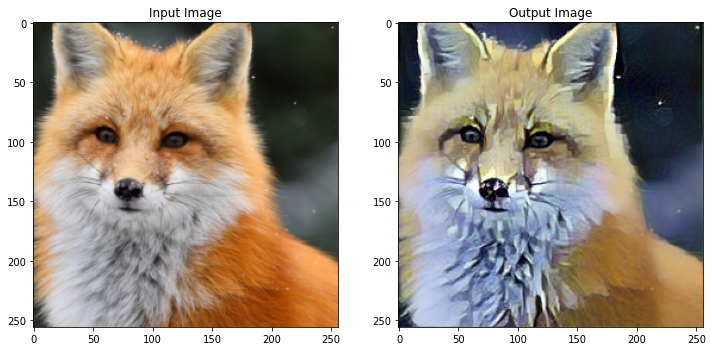

run [400]:
Style Loss : 3.919194 Content Loss: 5.860972



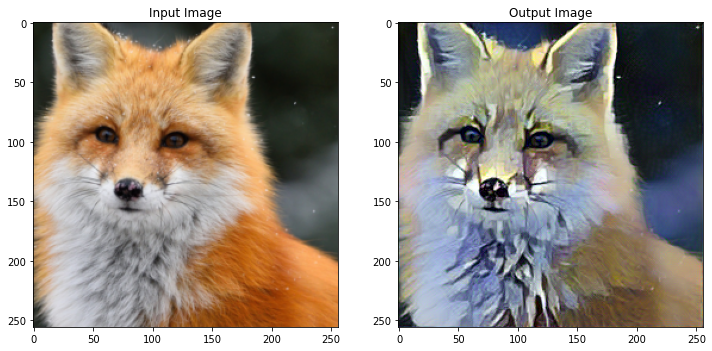

run [600]:
Style Loss : 3.421627 Content Loss: 5.719871



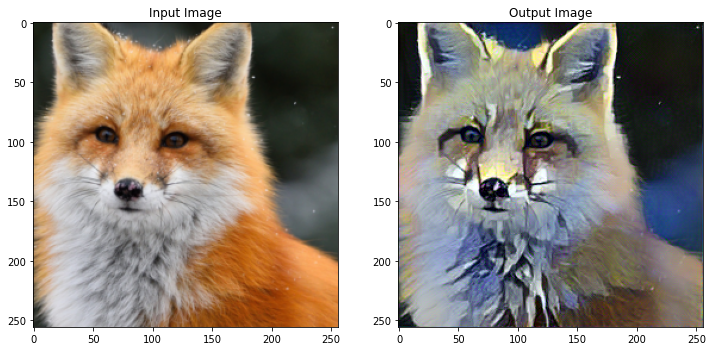

run [800]:
Style Loss : 3.198124 Content Loss: 5.768290



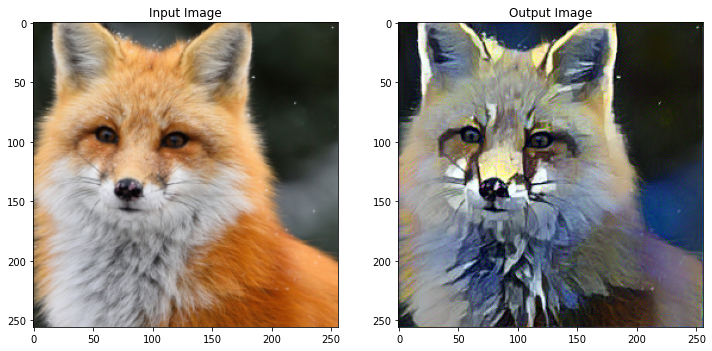

run [1000]:
Style Loss : 3.295366 Content Loss: 6.044353



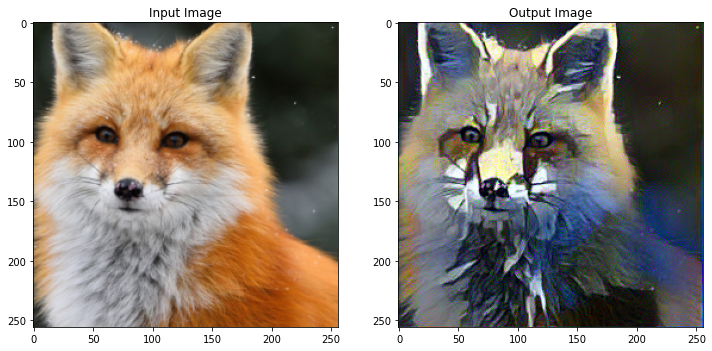

In [172]:
input_img = content_img_1.clone()
# if you want to use white noise instead uncomment the below line:
# input_img = torch.randn(content_img.data.size(), device=device)

# add the original input image to the figure:

params = torch.tensor([1, 1, 0, 0]) #coefficient for styles img

output = run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std,
                            content_img_1, style_img, input_img, params, num_steps = 1000)

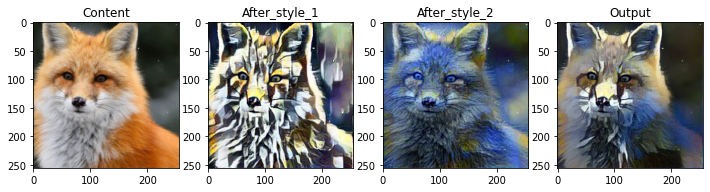

In [173]:
imshow(torch.cat([content_img_1, after_style_1, after_style_2, output], dim=0), ["Content", "After_style_1", "After_style_2", "Output"])

### More examples

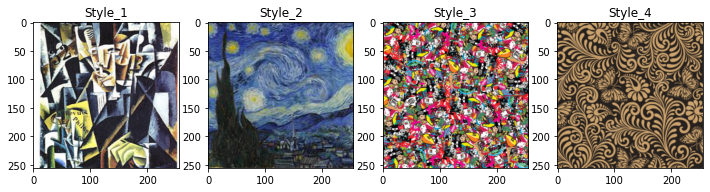

Add more first and second (2/1.5/0/0):


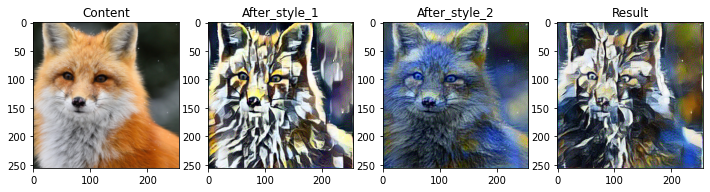

Use first and fourth (1.5/0/0/1.5):


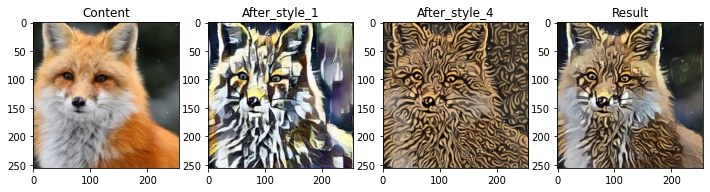

Use all 1.2/1.2/0.6/0.8):


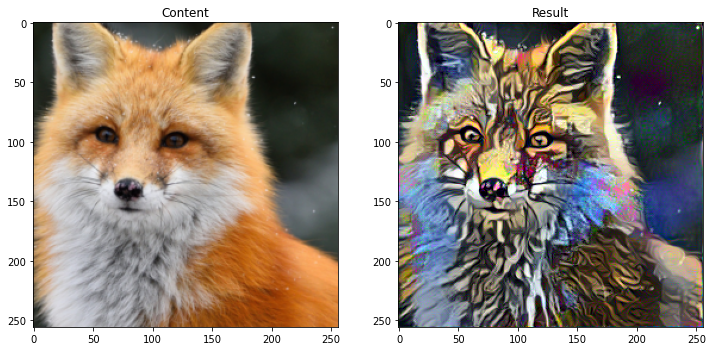

Try other content (0/1.2./0/1.2):


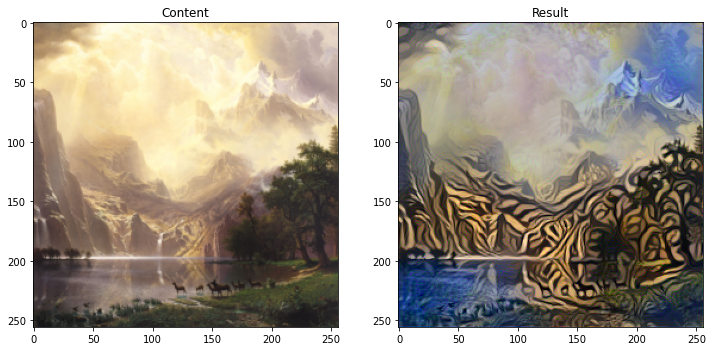

Try other styles (0.2/0.2/0.8/0.4):


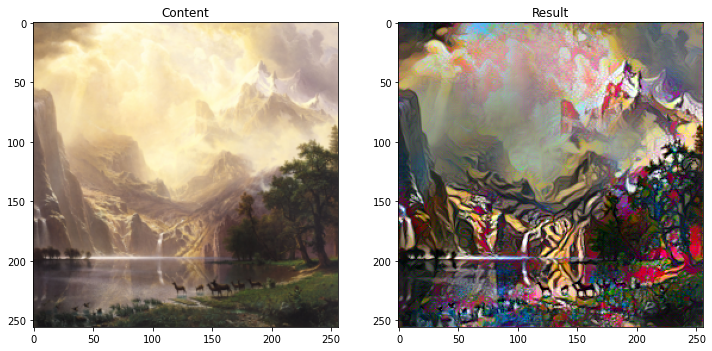

In [174]:
imshow(style_img, ["Style_1", "Style_2","Style_3","Style_4"])

print("Add more first and second (2/1.5/0/0):")
imshow(torch.cat([content_img_1, after_style_1, after_style_2, run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std,
                content_img_1, style_img, content_img_1.clone(), torch.tensor([2, 1.5, 0, 0]), num_steps = 1000, show = False)], dim=0), 
                  ["Content", "After_style_1", "After_style_2", "Result"])

print("Use first and fourth (1.5/0/0/1.5):")
imshow(torch.cat([content_img_1, after_style_1, after_style_4, run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std,
                content_img_1, style_img, content_img_1.clone(), torch.tensor([1, 0, 0, 1.5]), num_steps = 1000, show = False)], dim=0), 
                  ["Content", "After_style_1", "After_style_4", "Result"])


print("Use all 1.2/1.2/0.6/0.8):")
imshow(torch.cat([content_img_1, run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std,
                content_img_1, style_img, content_img_1.clone(), torch.tensor([1.2, 1.2, 0.2, 0.8]), num_steps = 1000, show = False)], dim=0), 
                  ["Content", "Result"])


print("Try other content (0/1.2./0/1.2):")
imshow(torch.cat([content_img_2, run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std,
                content_img_2, style_img, content_img_2.clone(), torch.tensor([0, 1.2, 0, 1.2]), num_steps = 1000, show = False)], dim=0), 
                  ["Content", "Result"])

print("Try other styles (0.2/0.2/0.8/0.4):")
imshow(torch.cat([content_img_2, run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std,
                content_img_2, style_img, content_img_2.clone(), torch.tensor([0.2, 0.2, 0.8, 0.4]), num_steps = 1000, show = False)], dim=0), 
                  ["Content", "Result"])


# Run Separate Style Transfer

In [175]:
style_img = torch.cat([style_img[0:1], style_img[3:], style_img[1:2], style_img[2:3]], dim = 0) #change style's order

Building the style transfer model..
Optimizing..
run [200]:
Style Loss : 59.832581 Content Loss: 43.982338



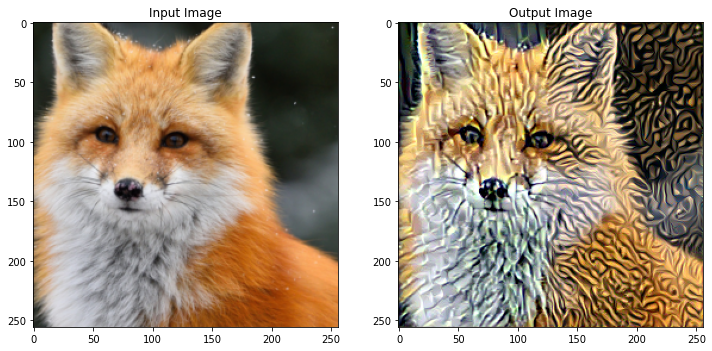

run [400]:
Style Loss : 6.498020 Content Loss: 41.685730



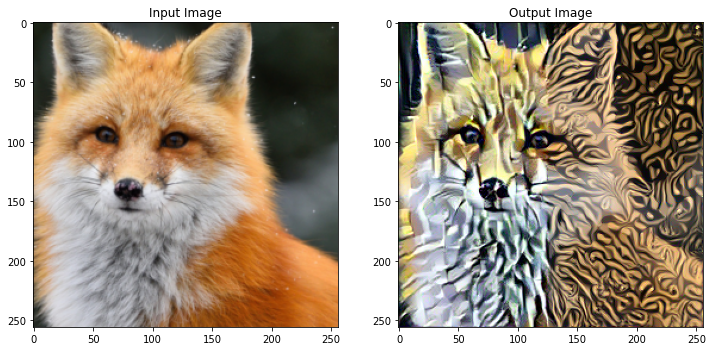

run [600]:
Style Loss : 3.607226 Content Loss: 39.055965



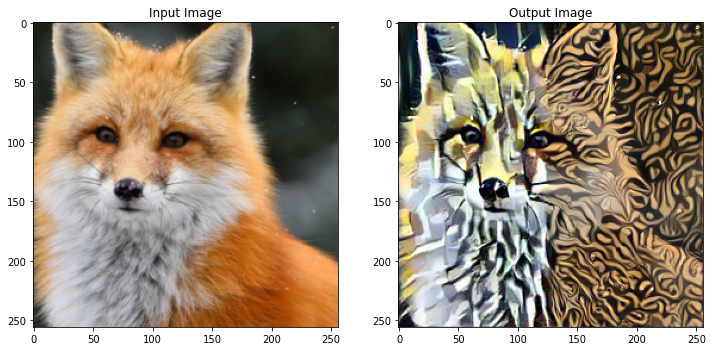

run [800]:
Style Loss : 3.147866 Content Loss: 38.144585



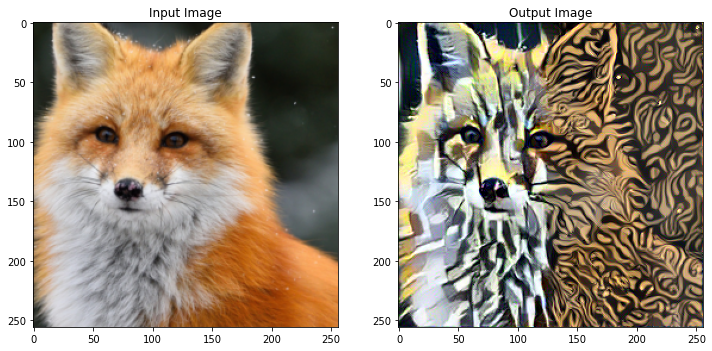

run [1000]:
Style Loss : 3.205792 Content Loss: 38.251736



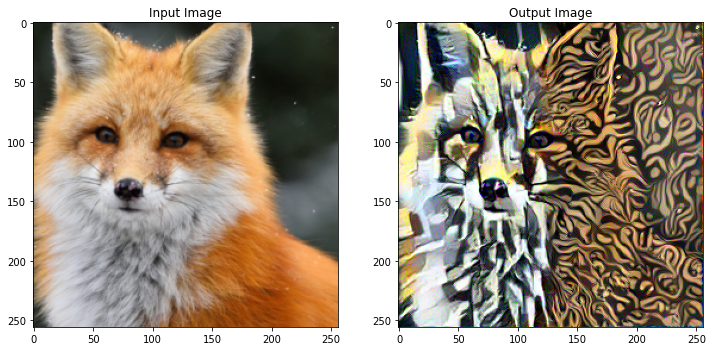

In [67]:
output = run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std,
                            content_img_1, style_img[0:2], content_img_1.clone(), mode = "sep", 
                            params = torch.tensor([0.5, 1]), num_steps = 1000)

## More Exampples

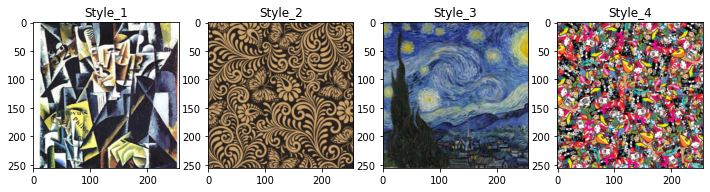

Try more styles (1/1/0.05/0):


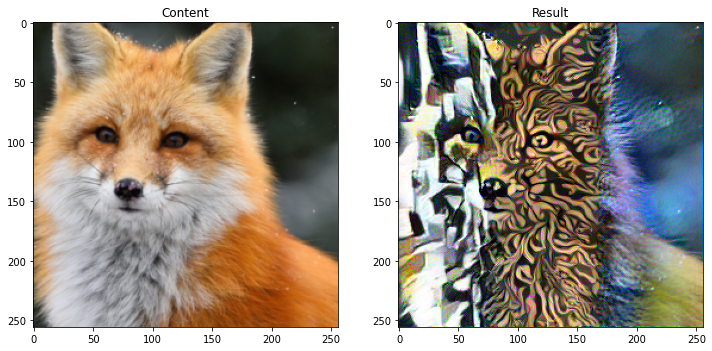

Try other content (1/1/1/1):


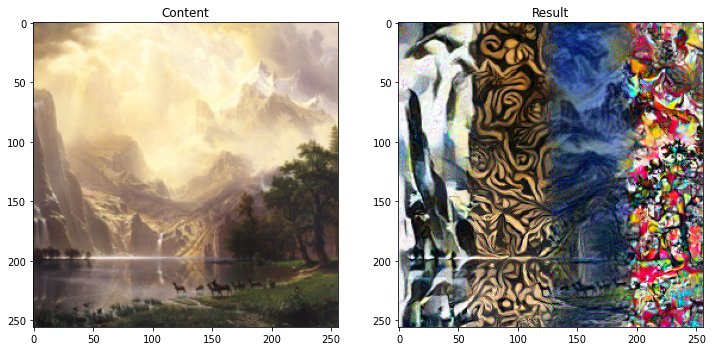

In [105]:
imshow(style_img, ["Style_1", "Style_2","Style_3","Style_4"])

print("Try more styles (1/1/0.05/0):")
imshow(torch.cat([content_img_1, run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std,
                content_img_1, style_img[0:3], content_img_1.clone(), torch.tensor([1, 1, 0.05]), mode = "sep", num_steps = 1000, show = False)], dim=0), 
                  ["Content", "Result"])

print("Try other content (1/1/1/1):")
imshow(torch.cat([content_img_2, run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std,
                content_img_2, style_img, content_img_2.clone(), torch.tensor([1, 1, 1, 1]), mode = "sep", num_steps = 1000, show = False)], dim=0), 
                  ["Content", "Result"])

### Try using mask

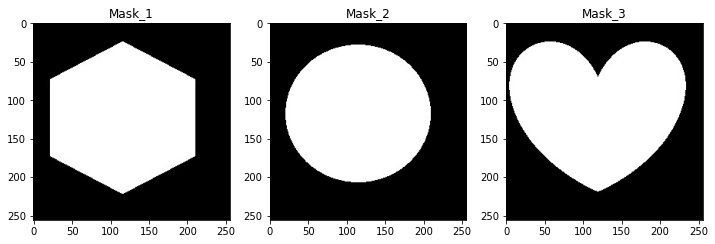

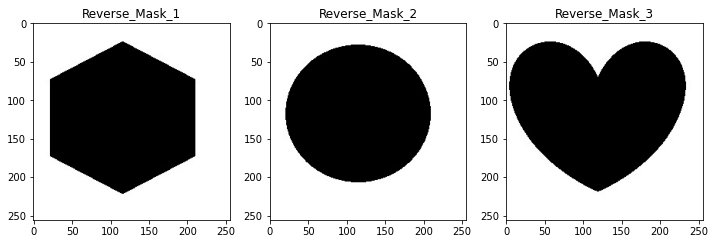

In [180]:
def mask_reverse (mask):
    return torch.abs(mask-1)

mask_1 = image_loader("mask_1.jpg")
mask_2 = image_loader("mask_2.jpg")
mask_3 = image_loader("mask_3.jpg")

imshow(torch.cat([mask_1, mask_2, mask_3], dim = 0), title=['Mask_1', 'Mask_2', "Mask_3"])
imshow(torch.cat([mask_reverse(mask_1), mask_reverse(mask_2), mask_reverse(mask_3)], dim = 0), 
       title=['Reverse_Mask_1', 'Reverse_Mask_2', "Reverse_Mask_3"])

Building the style transfer model..
Optimizing..
run [200]:
Style Loss : 48.499157 Content Loss: 45.367500



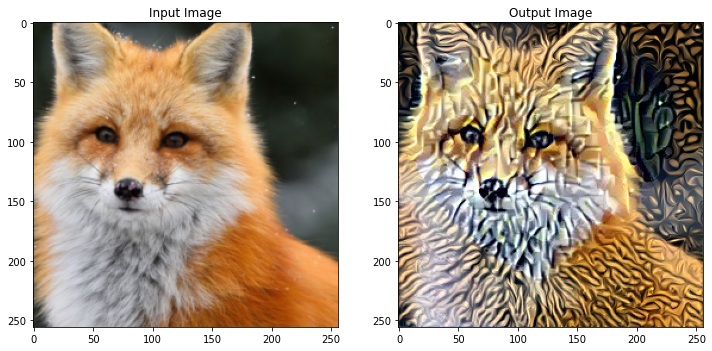

run [400]:
Style Loss : 5.154144 Content Loss: 41.208771



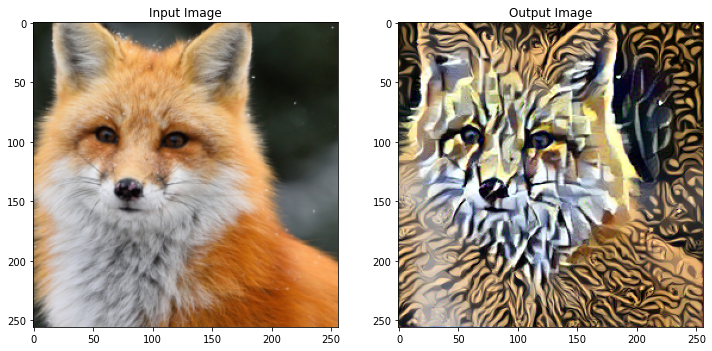

run [600]:
Style Loss : 3.370032 Content Loss: 38.611038



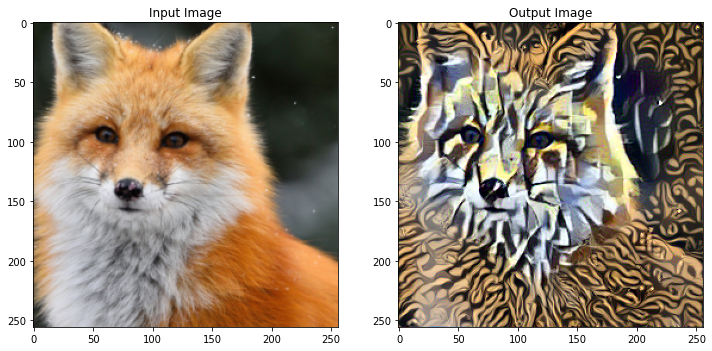

run [800]:
Style Loss : 3.109915 Content Loss: 37.894760



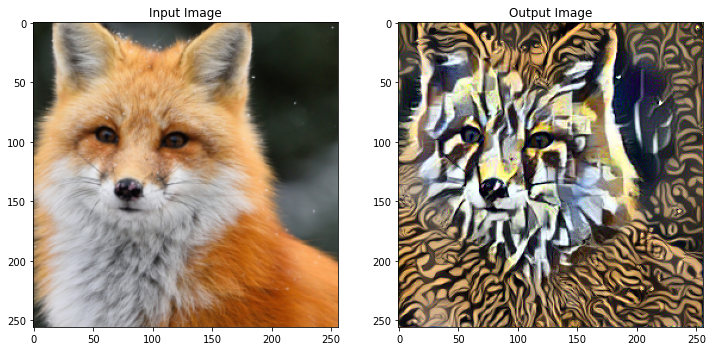

run [1000]:
Style Loss : 3.332641 Content Loss: 37.702682



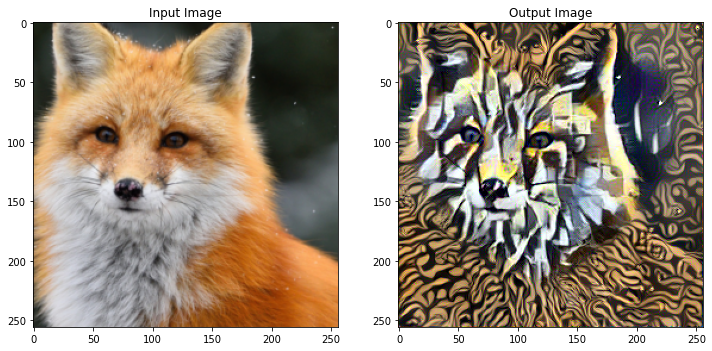

In [183]:
##Try mask_3
output = run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std,
                content_img_1, style_img[0:2], content_img_1.clone(), mode = "sep", 
                mask = ["mask_3.jpg"], num_steps = 1000, show = True)

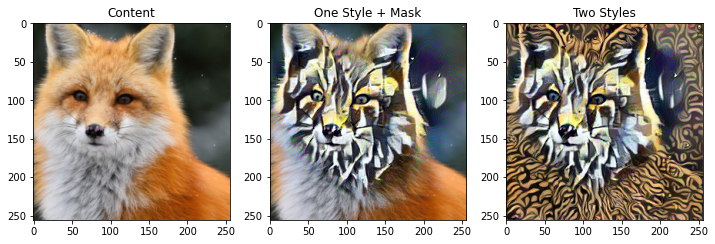

In [184]:
one_style = run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std,
                content_img_1, style_img[0:1], content_img_1.clone(), mode = "sep", 
                mask = ["mask_3.jpg"], num_steps = 1000, show = False)

imshow(torch.cat([content_img_1, one_style, output], dim=0), ["Content", "One Style + Mask", "Two Styles"])

### More masks and examples

Try other mask:


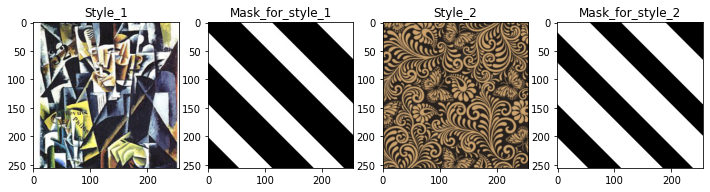

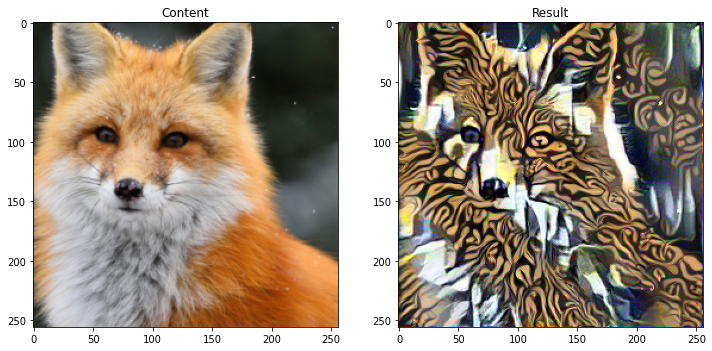

Try other styles:


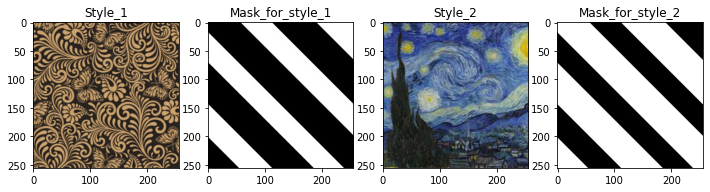

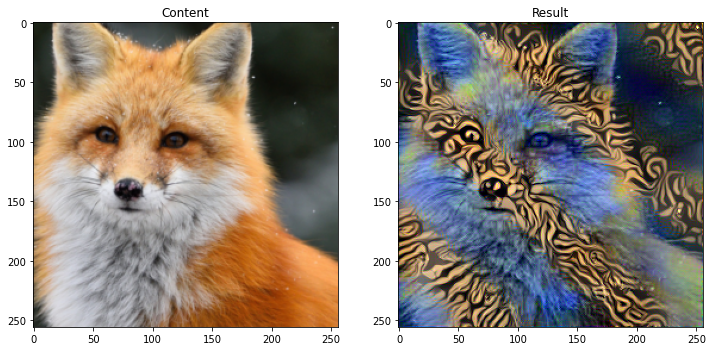

In [147]:
mask_4 = image_loader("mask_4(2).jpg")

print("Try other mask:")
imshow(torch.cat([style_img[0:1], mask_4, style_img[1:2], mask_reverse(mask_4)], dim = 0), 
       title=["Style_1", 'Mask_for_style_1', "Style_2", 'Mask_for_style_2'])

imshow(torch.cat([content_img_1, run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std,
                content_img_1, style_img[0:2], content_img_1.clone(), mask = ["mask_4(2).jpg"], mode = "sep", num_steps = 1000, show = False)], dim=0), 
                  ["Content", "Result"])

print("Try other styles:")

imshow(torch.cat([style_img[1:2], mask_4, style_img[2:3], mask_reverse(mask_4)], dim = 0), 
       title=["Style_1", 'Mask_for_style_1', "Style_2", 'Mask_for_style_2'])

imshow(torch.cat([content_img_1, run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std,
                content_img_1, style_img[1:3], content_img_1.clone(), mask = ["mask_4(2).jpg"], mode = "sep", num_steps = 1000, show = False)], dim=0), 
                  ["Content", "Result"])

Try more styles:


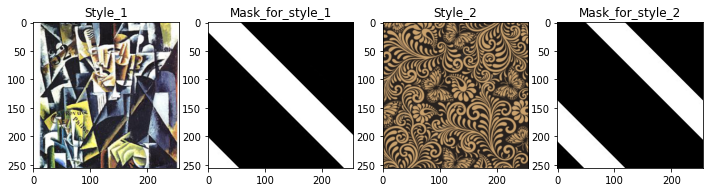

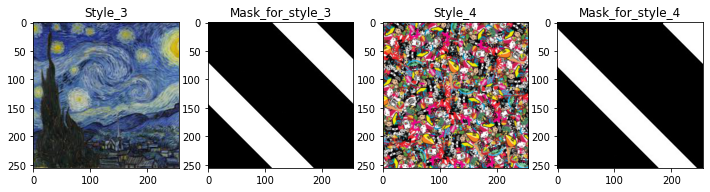

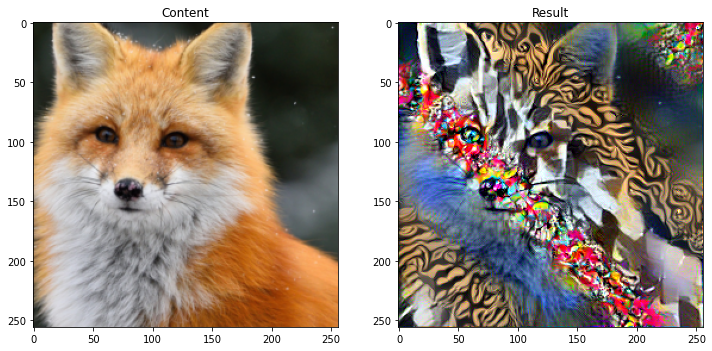

In [177]:
mask_4_1 = image_loader("mask_4(4)_1.jpg")
mask_4_2 = image_loader("mask_4(4)_2.jpg")
mask_4_3 = image_loader("mask_4(4)_3.jpg")
mask_4_4 = image_loader("mask_4(4)_4.jpg")

print("Try more styles:")
imshow(torch.cat([style_img[0:1], mask_4_1, style_img[1:2], mask_4_2], dim = 0), 
       title=["Style_1", 'Mask_for_style_1', "Style_2", 'Mask_for_style_2'])

imshow(torch.cat([style_img[2:3], mask_4_3, style_img[3:4], mask_4_4], dim = 0), 
       title=["Style_3", 'Mask_for_style_3', "Style_4", 'Mask_for_style_4'])

imshow(torch.cat([content_img_1, run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std,
                content_img_1, style_img, content_img_1.clone(), 
                mask = ["mask_4(4)_1.jpg", "mask_4(4)_2.jpg", "mask_4(4)_3.jpg", "mask_4(4)_4.jpg"], 
                mode = "sep", params = torch.tensor([1, 1, 1, 1]), num_steps = 1000, show = False)], dim=0), ["Content", "Result"])

Try other content:


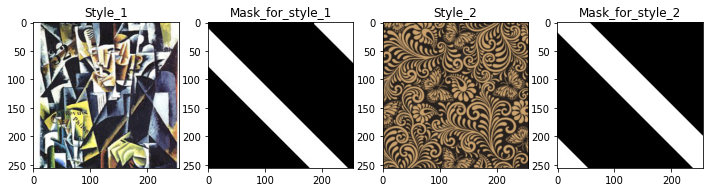

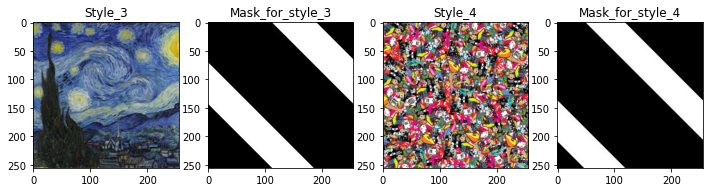

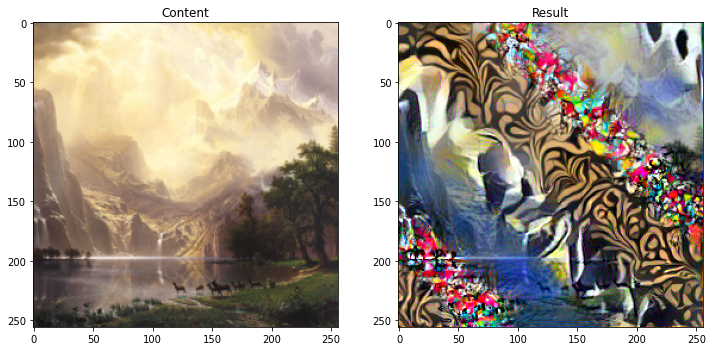

In [182]:
print("Try other content:")
imshow(torch.cat([style_img[0:1], mask_4_4, style_img[1:2], mask_4_1], dim = 0), 
       title=["Style_1", 'Mask_for_style_1', "Style_2", 'Mask_for_style_2'])

imshow(torch.cat([style_img[2:3], mask_4_3, style_img[3:4], mask_4_2], dim = 0), 
       title=["Style_3", 'Mask_for_style_3', "Style_4", 'Mask_for_style_4'])

imshow(torch.cat([content_img_2, run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std,
                content_img_2, style_img, content_img_2.clone(), 
                mask = ["mask_4(4)_4.jpg", "mask_4(4)_1.jpg", "mask_4(4)_3.jpg", "mask_4(4)_2.jpg"], 
                mode = "sep", num_steps = 1000, show = False)], dim=0), ["Content", "Result"])